In [3]:
%matplotlib inline
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1" 
import sys
import random
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images, imsave
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K

from keras.optimizers import *

import tensorflow as tf

from sklearn.metrics import f1_score

seed = 42
random.seed = seed
np.random.seed = seed

In [4]:
IMG_HEIGHT = 400
IMG_WIDTH = 400
IMG_CHANNELS = 3

In [5]:
# Helper functions

def load_image(infilename):
    data = imread(infilename)[:,:,:IMG_CHANNELS]
    return data

def load_image_label(infilename):
    data = imread(infilename)
    return data

def img_float_to_uint8(img):
    rimg = img - np.min(img)
    rimg = (rimg / np.max(rimg) * 255).round().astype(np.uint8)
    return rimg

# Concatenate an image and its groundtruth
def concatenate_images(img, gt_img):
    nChannels = len(gt_img.shape)
    w = gt_img.shape[0]
    h = gt_img.shape[1]
    if nChannels == 3:
        cimg = np.concatenate((img, gt_img), axis=1)
    else:
        gt_img_3c = np.zeros((w, h, 3), dtype=np.uint8)
        gt_img8 = img_float_to_uint8(gt_img)          
        gt_img_3c[:,:,0] = gt_img8
        gt_img_3c[:,:,1] = gt_img8
        gt_img_3c[:,:,2] = gt_img8
        img8 = img_float_to_uint8(img)
        cimg = np.concatenate((img8, gt_img_3c), axis=1)
    return cimg

def img_crop(im, w, h):
    list_patches = []
    imgwidth = im.shape[0]
    imgheight = im.shape[1]
    is_2d = len(im.shape) < 3
    for i in range(0,imgheight,h):
        for j in range(0,imgwidth,w):
            if is_2d:
                im_patch = im[j:j+w, i:i+h]
            else:
                im_patch = im[j:j+w, i:i+h, :]
            list_patches.append(im_patch)
    return list_patches

In [6]:
# Loaded a set of images
root_dir = "data/training/"

image_dir = root_dir + "images/"
files = os.listdir(image_dir)
n = min(400, len(files)) # Load maximum 20 images
print("Loading " + str(n) + " images")
imgs = [load_image(image_dir + files[i]) for i in range(n)]
print(files[0])

gt_dir = root_dir + "groundtruth/"
print("Loading " + str(n) + " images")
gt_imgs = [load_image_label(gt_dir + files[i]) for i in range(n)]
print(files[0])


Loading 100 images
satImage_001.png
Loading 100 images
satImage_001.png


In [7]:
imgs[0].shape

(400, 400, 3)

In [8]:
# Define IoU metric
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)

In [9]:
X_train = np.array(imgs)
Y_train = np.zeros((len(imgs), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
mask = np.zeros((IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
for i in range(len(imgs)):
    mask_ = np.expand_dims(gt_imgs[i], axis=-1)
    Y_train[i] = mask_

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


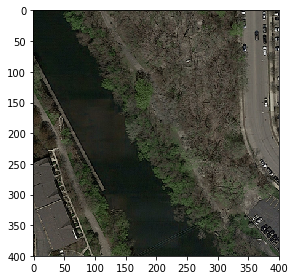

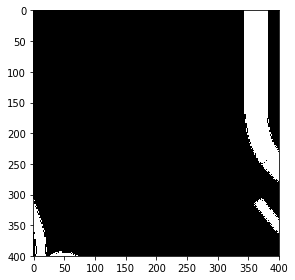

In [10]:
# Check if training data looks all right
ix = random.randint(0, len(imgs) - 1)
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()

In [11]:
print(X_train.shape)
print(Y_train.shape)
print(X_train.dtype)
print(Y_train.dtype)

(100, 400, 400, 3)
(100, 400, 400, 1)
uint8
bool


In [12]:
print(len(Y_train[Y_train == True]))

3604158


In [13]:
# Build U-Net model
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 400, 400, 3)  0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 400, 400, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 400, 400, 16) 448         lambda_1[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 400, 400, 16) 0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (

In [14]:
# Fit model
earlystopper = EarlyStopping(patience=10, verbose=1)
checkpointer = ModelCheckpoint('model-dsbowl2018-1.h5', verbose=1, save_best_only=True)
results = model.fit(X_train, Y_train, validation_split=0.1, batch_size=2, epochs=50, 
                    callbacks=[earlystopper, checkpointer])

Train on 90 samples, validate on 10 samples
Epoch 1/50
90/90 [==============================] - ETA: 5:40 - loss: 0.9267 - acc: 0.368 - ETA: 3:55 - loss: 0.9253 - acc: 0.363 - ETA: 3:18 - loss: 0.9004 - acc: 0.380 - ETA: 2:59 - loss: 0.8823 - acc: 0.390 - ETA: 2:47 - loss: 0.8603 - acc: 0.408 - ETA: 2:37 - loss: 0.8492 - acc: 0.417 - ETA: 2:29 - loss: 0.8329 - acc: 0.431 - ETA: 2:23 - loss: 0.8157 - acc: 0.449 - ETA: 2:16 - loss: 0.8010 - acc: 0.463 - ETA: 2:11 - loss: 0.7855 - acc: 0.480 - ETA: 2:06 - loss: 0.7695 - acc: 0.498 - ETA: 2:01 - loss: 0.7537 - acc: 0.517 - ETA: 1:57 - loss: 0.7440 - acc: 0.529 - ETA: 1:52 - loss: 0.7351 - acc: 0.541 - ETA: 1:48 - loss: 0.7249 - acc: 0.554 - ETA: 1:44 - loss: 0.7173 - acc: 0.564 - ETA: 1:40 - loss: 0.7096 - acc: 0.575 - ETA: 1:36 - loss: 0.6969 - acc: 0.589 - ETA: 1:32 - loss: 0.6937 - acc: 0.596 - ETA: 1:29 - loss: 0.6842 - acc: 0.607 - ETA: 1:25 - loss: 0.6837 - acc: 0.611 - ETA: 1:21 - loss: 0.6814 - acc: 0.616 - ETA: 1:17 - loss: 0.6765

90/90 [==============================] - ETA: 4:07 - loss: 0.4288 - acc: 0.773 - ETA: 4:16 - loss: 0.3317 - acc: 0.836 - ETA: 4:12 - loss: 0.3258 - acc: 0.848 - ETA: 4:06 - loss: 0.3502 - acc: 0.836 - ETA: 4:03 - loss: 0.3340 - acc: 0.845 - ETA: 3:52 - loss: 0.3148 - acc: 0.857 - ETA: 3:42 - loss: 0.3144 - acc: 0.859 - ETA: 3:33 - loss: 0.3123 - acc: 0.860 - ETA: 3:25 - loss: 0.3215 - acc: 0.854 - ETA: 3:20 - loss: 0.3175 - acc: 0.857 - ETA: 3:13 - loss: 0.3248 - acc: 0.853 - ETA: 3:06 - loss: 0.3295 - acc: 0.850 - ETA: 3:00 - loss: 0.3281 - acc: 0.851 - ETA: 2:53 - loss: 0.3373 - acc: 0.844 - ETA: 2:48 - loss: 0.3388 - acc: 0.845 - ETA: 2:42 - loss: 0.3324 - acc: 0.849 - ETA: 2:37 - loss: 0.3343 - acc: 0.848 - ETA: 2:31 - loss: 0.3267 - acc: 0.852 - ETA: 2:24 - loss: 0.3235 - acc: 0.855 - ETA: 2:19 - loss: 0.3283 - acc: 0.850 - ETA: 2:13 - loss: 0.3264 - acc: 0.852 - ETA: 2:07 - loss: 0.3210 - acc: 0.855 - ETA: 2:02 - loss: 0.3198 - acc: 0.856 - ETA: 1:56 - loss: 0.3171 - acc: 0.857 -

90/90 [==============================] - ETA: 3:29 - loss: 0.2530 - acc: 0.888 - ETA: 3:25 - loss: 0.2038 - acc: 0.912 - ETA: 3:20 - loss: 0.1896 - acc: 0.921 - ETA: 3:15 - loss: 0.1845 - acc: 0.924 - ETA: 3:10 - loss: 0.1709 - acc: 0.931 - ETA: 3:05 - loss: 0.1902 - acc: 0.922 - ETA: 3:00 - loss: 0.2128 - acc: 0.909 - ETA: 2:56 - loss: 0.2171 - acc: 0.906 - ETA: 2:50 - loss: 0.2339 - acc: 0.898 - ETA: 2:46 - loss: 0.2220 - acc: 0.904 - ETA: 2:42 - loss: 0.2239 - acc: 0.903 - ETA: 2:37 - loss: 0.2317 - acc: 0.900 - ETA: 2:33 - loss: 0.2375 - acc: 0.897 - ETA: 2:28 - loss: 0.2350 - acc: 0.899 - ETA: 2:24 - loss: 0.2430 - acc: 0.893 - ETA: 2:19 - loss: 0.2465 - acc: 0.891 - ETA: 2:13 - loss: 0.2489 - acc: 0.890 - ETA: 2:08 - loss: 0.2421 - acc: 0.893 - ETA: 2:03 - loss: 0.2396 - acc: 0.895 - ETA: 1:58 - loss: 0.2427 - acc: 0.894 - ETA: 1:54 - loss: 0.2369 - acc: 0.897 - ETA: 1:50 - loss: 0.2321 - acc: 0.899 - ETA: 1:46 - loss: 0.2310 - acc: 0.899 - ETA: 1:41 - loss: 0.2386 - acc: 0.896 -

In [15]:

# Predict on train, val and test
#model = load_model('model-dsbowl2018-1.h5', custom_objects={'mean_iou': mean_iou})
model = load_model('model-dsbowl2018-1.h5')
preds_train = model.predict(X_train[:int(X_train.shape[0]*0.9)], verbose=1)
preds_val = model.predict(X_train[int(X_train.shape[0]*0.9):], verbose=1)
#preds_test = model.predict(X_test, verbose=1)

# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)
#preds_test_t = (preds_test > 0.5).astype(np.uint8)

10/10 [==============================] - 8s 770ms/step


In [16]:
preds_train_t[0]

array([[[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [1]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       ...,

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]],

       [[0],
        [0],
        [0],
        ...,
        [0],
        [0],
        [0]]], dtype=uint8)

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


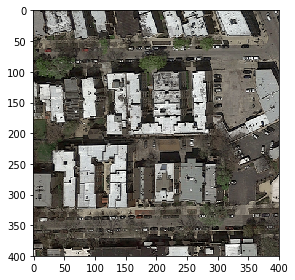

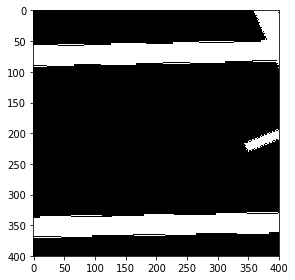

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


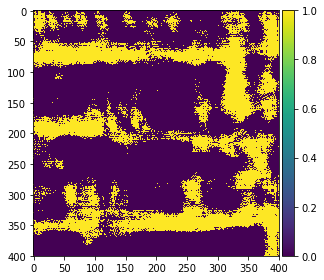

In [17]:
# Perform a sanity check on some random training samples
ix = random.randint(0, len(preds_train_t))
imshow(X_train[ix])
plt.show()
imshow(np.squeeze(Y_train[ix]))
plt.show()
imshow(np.squeeze(preds_train_t[ix]))
plt.show()

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


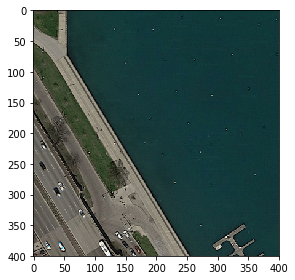

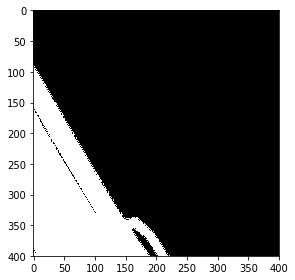

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


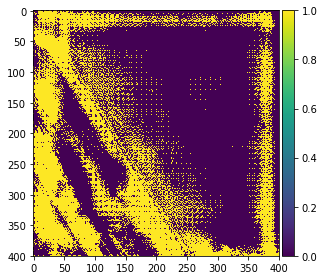

In [18]:
# Perform a sanity check on some random validation samples
ix = random.randint(0, len(preds_val_t))
imshow(X_train[int(X_train.shape[0]*0.9):][ix])
plt.show()
imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))
plt.show()
imshow(np.squeeze(preds_val_t[ix]))
plt.show()


In [19]:
print(preds_train_t.shape)
print()
print(f1_score(preds_val_t.flatten(), Y_train[int(Y_train.shape[0]*0.9):].flatten(), average="binary"))

(90, 400, 400, 1)

0.5698667171321203


In [20]:
test_path = "data/test_set_images/"
files = os.listdir(test_path)
print("Loading " + str(len(files)) + " images")
imgs = []
for i in range(len(files)):
    imgs.append(load_image(test_path + "test_" + str(i+1) + "/test_" + str(i+1) + ".png"))
print(files)
print(imgs[0])

Loading 50 images
['test_1', 'test_10', 'test_11', 'test_12', 'test_13', 'test_14', 'test_15', 'test_16', 'test_17', 'test_18', 'test_19', 'test_2', 'test_20', 'test_21', 'test_22', 'test_23', 'test_24', 'test_25', 'test_26', 'test_27', 'test_28', 'test_29', 'test_3', 'test_30', 'test_31', 'test_32', 'test_33', 'test_34', 'test_35', 'test_36', 'test_37', 'test_38', 'test_39', 'test_4', 'test_40', 'test_41', 'test_42', 'test_43', 'test_44', 'test_45', 'test_46', 'test_47', 'test_48', 'test_49', 'test_5', 'test_50', 'test_6', 'test_7', 'test_8', 'test_9']
[[[ 51  46  43]
  [ 47  43  40]
  [ 59  51  47]
  ...
  [121 117 110]
  [144 140 131]
  [138 135 126]]

 [[ 57  51  47]
  [ 50  45  42]
  [ 56  49  45]
  ...
  [ 72  69  65]
  [142 137 128]
  [140 136 127]]

 [[ 59  55  51]
  [ 57  50  46]
  [ 54  47  44]
  ...
  [138 133 124]
  [135 129 118]
  [134 128 117]]

 ...

 [[132 126 114]
  [139 134 123]
  [140 134 123]
  ...
  [ 79  83  77]
  [ 80  82  77]
  [ 84  87  82]]

 [[128 122 110]
  

In [21]:
X_test = np.zeros((50, 400, 400, 3), dtype=np.uint8)
for i in range(50):
    img = resize(imgs[i], (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[i] = img
preds_test = model.predict(X_test, verbose=1)
preds_test_t = (preds_test > 0.5).astype(np.uint8)

50/50 [==============================] - ETA: 19 - 49s 980ms/step


In [22]:
X_test_s = np.zeros((50, 608, 608, 3), dtype=np.uint8)
preds_test_t_s = np.zeros((50, 608, 608, 1), dtype=np.uint8)

for i in range(50):
    img = resize(X_test[i], (608, 608), mode='constant', preserve_range=True)
    X_test_s[i] = img
    img = resize(preds_test_t[i], (608, 608), mode='constant', preserve_range=True)
    preds_test_t_s[i] = img

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


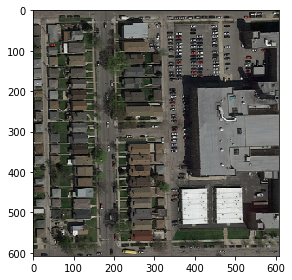

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


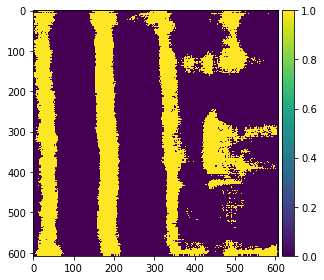

In [23]:
# Perform a sanity check on some random test samples
ix = random.randint(0, len(preds_test_t_s))
imshow(X_test_s[ix])
plt.show()
imshow(np.squeeze(preds_test_t_s[ix]))
plt.show()

In [25]:
preds_test_t_s = preds_test_t_s.reshape((50, 608, 608))
for i in range(50):
    imsave("results/test_" + str(i + 1) + ".png", preds_test_t_s[i]) #*255

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_6.png is a low contrast image
  warn('%s is a low contrast image' % fname

C:\Users\antho\Anaconda3\lib\site-packages\skimage\io\_io.py:132: UserWarning: results/test_50.png is a low contrast image
  warn('%s is a low contrast image' % fname)


In [26]:
import re

foreground_threshold = 0.25 # percentage of pixels > 1 required to assign a foreground label to a patch

# assign a label to a patch
def patch_to_label(patch):
    df = np.mean(patch)
    if df > foreground_threshold:
        return 1
    else:
        return 0


def mask_to_submission_strings(image_filename):
    """Reads a single image and outputs the strings that should go into the submission file"""
    img_number = int(re.search(r"\d+", image_filename).group(0))
    im = imread(image_filename)
    patch_size = 16
    for j in range(0, im.shape[1], patch_size):
        for i in range(0, im.shape[0], patch_size):
            patch = im[i:i + patch_size, j:j + patch_size]
            label = patch_to_label(patch)
            yield("{:03d}_{}_{},{}".format(img_number, j, i, label))


def masks_to_submission(submission_filename, *image_filenames):
    """Converts images into a submission file"""
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn in image_filenames[0:]:
            print(str(fn))
            f.writelines('{}\n'.format(s) for s in mask_to_submission_strings(fn))


submission_filename = 'submission.csv'
image_filenames = []
for i in range(1, 51):
    image_filename = 'results/test_' + str(i) + '.png'
    print(image_filename)
    image_filenames.append(image_filename)
masks_to_submission(submission_filename, *image_filenames)

results/test_1.png
results/test_2.png
results/test_3.png
results/test_4.png
results/test_5.png
results/test_6.png
results/test_7.png
results/test_8.png
results/test_9.png
results/test_10.png
results/test_11.png
results/test_12.png
results/test_13.png
results/test_14.png
results/test_15.png
results/test_16.png
results/test_17.png
results/test_18.png
results/test_19.png
results/test_20.png
results/test_21.png
results/test_22.png
results/test_23.png
results/test_24.png
results/test_25.png
results/test_26.png
results/test_27.png
results/test_28.png
results/test_29.png
results/test_30.png
results/test_31.png
results/test_32.png
results/test_33.png
results/test_34.png
results/test_35.png
results/test_36.png
results/test_37.png
results/test_38.png
results/test_39.png
results/test_40.png
results/test_41.png
results/test_42.png
results/test_43.png
results/test_44.png
results/test_45.png
results/test_46.png
results/test_47.png
results/test_48.png
results/test_49.png
results/test_50.png
results/t

In [139]:
import math
from PIL import Image

label_file = 'submission.csv'

h = 16
w = h
imgwidth = int(math.ceil((600.0/w))*w)
imgheight = int(math.ceil((600.0/h))*h)
nc = 3

# Convert an array of binary labels to a uint8
def binary_to_uint8(img):
    rimg = (img * 255).round().astype(np.uint8)
    return rimg

def reconstruct_from_labels(image_id):
    im = np.zeros((imgwidth, imgheight), dtype=np.uint8)
    f = open(label_file)
    lines = f.readlines()
    image_id_str = '%.3d_' % image_id
    for i in range(1, len(lines)):
        line = lines[i]
        if not image_id_str in line:
            continue

        tokens = line.split(',')
        id = tokens[0]
        prediction = int(tokens[1])
        tokens = id.split('_')
        i = int(tokens[1])
        j = int(tokens[2])

        je = min(j+w, imgwidth)
        ie = min(i+h, imgheight)
        if prediction == 0:
            adata = np.zeros((w,h))
        else:
            adata = np.ones((w,h))

        im[j:je, i:ie] = binary_to_uint8(adata)

    Image.fromarray(im).save('test/prediction_' + str(image_id) + '.png')

    return im

for i in range(1, 51):
    reconstruct_from_labels(i)

In [97]:
from numpy import zeros, newaxis

def make_img_overlay(img, predicted_img):
    w = img.shape[0]
    h = img.shape[1]
    color_mask = np.zeros((w, h, 3), dtype=np.uint8)

    test = predicted_img
    color_mask[:,:,0] = test
    img8 = img_float_to_uint8(img)
    background = Image.fromarray(img8, 'RGB').convert("RGBA")
    overlay = Image.fromarray(color_mask, 'RGB').convert("RGBA")
    new_img = Image.blend(background, overlay, 0.2)
    return new_img

In [143]:
files = os.listdir("data/test_set_images/")
print("Loading " + str(len(files)) + " images")
imgs_test = [load_image_label("data/test_set_images/"+ str(files[i])+"/" + files[i] + ".png") for i in range(len(files))]


files_p = os.listdir("test/")
print("Loading " + str(len(files_p)) + " images")
imgs_p = [load_image_label("test/" + files_p[i]) for i in range(len(files_p))]


Loading 50 images
Loading 50 images


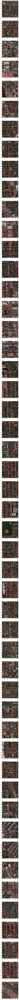

In [142]:
#ix = random.randint(0, 50)
plt.figure(figsize=(300, 300))

columns = 1
for i in range(0,50):
    plt.subplot(50 / columns + 1, columns, i + 1)
    plt.imshow(make_img_overlay(imgs_test[i], imgs_p[i]))
